In [58]:
import random
import copy
import pickle
import pandas as pd


In [2]:
def roll_dice(type_dice, how_many):
    total = 0
    total += random.randint(1,type_dice)
    return total

In [3]:
class Titan:
    def __init__(self, key, name, ac, strength, init, hp, attacks, damage):
        self.name = name
        self.ac = ac
        self.strength = strength
        self.init = init
        self.total_hp = hp
        self.hp = hp
        self.attacks = attacks
        self.damage = damage
        self.dead = False
        self.missed = 0
    
    def attack(self, titan):
        for i in range(self.attacks):
            total_attack = roll_dice(20, 1) + self.strength
            if total_attack > titan.ac:
                total_damage = roll_dice(self.damage, 1) + self.strength
                print(self.name, 'deals', total_damage, 'damage to', titan.name)
                titan.lose_hp(total_damage)
            else:
                print(self.name, 'misses attack')
                self.missed += 1
    
    def lose_hp(self, wound):
        self.hp -= wound
        if self.hp<=0:
            self.die()
    
    def die(self):
        self.dead = True

In [4]:
attack_titan = Titan(0, 'Attack Titan', 15, 5, 2, 50, 3, 12)
beast_titan = Titan(1, 'Beast Titan', 13, 2, 1, 40, 1, 10)
colossal_titan = Titan(2, 'Colossal Titan', 10, 6, 0, 80, 1, 12)
armoured_titan = Titan(3, 'Armoured Titan', 17, 4, 1, 60, 1, 10)

In [13]:
def initiative_phase(titan_1, titan_2):
    attack_order = []
    init_score_1 = roll_dice(20,1) + titan_1.init
    init_score_2 = roll_dice(20,1) + titan_2.init
    if init_score_1 > init_score_2:
        attack_order = [1,2]
    elif init_score_1 < init_score_2:
        attack_order = [2,1]
    else:
        draw = roll_dice(100,1)
        if draw >= 50:
            attack_order = [1,2]
        else:
            attack_order = [2,1]
    return attack_order


def combat_phase(titan_1, titan_2, attack_order):
    titans_dict = {1:titan_1, 2:titan_2}
    for i in attack_order:
        attacker = titans_dict[i]
        defender = titans_dict[[x for x in attack_order if x != i][0]]
        if not attacker.dead and not defender.dead:
            attacker.attack(defender)
        elif attacker.dead:
            print(attacker.name, 'cannot attack because he is dead')
        elif defender.dead:
            print(defender.name, 'cannot be attacked because he is dead')
            
def duel(titan_1, titan_2):
    attack_order = initiative_phase(titan_1, titan_2)
    print(attack_order)
    print('\n')
    turn_count = 0
    result = {}
    while not titan_1.dead and not titan_2.dead:
        combat_phase(titan_1, titan_2, attack_order)
        turn_count +=1
        print('\n')
    if titan_1.dead:
        print('The winner is', titan_2.name)
        result = {'winner':titan_2, 'loser':titan_1, 'turns':turn_count}
    elif titan_2.dead:
        print('The winner is', titan_1.name)
        result = {'winner':titan_1, 'loser':titan_2, 'turns':turn_count}
    return result
    

In [21]:
titan_1_list = []
titan_2_list = []
total_damage_1_list = []
total_damage_2_list = []
missed_1_list = []
missed_2_list = []
winner_list = []
turns_list = []


for i in range (10000):
    titan_1 = Titan(1, 'Attack Titan', 15, 5, 2, 50, 3, 12)
    titan_2 = Titan(3, 'Armoured Titan', 17, 4, 1, 60, 1, 10)

    result = duel(titan_1, titan_2)

    titan_1_list.append(titan_1.name)
    titan_2_list.append(titan_2.name)
    if titan_2.hp<0:
        titan_2.hp = 0
    total_damage_1_list.append(titan_2.total_hp - titan_2.hp)
    if titan_1.hp <0:
        titan_1.hp = 0
    total_damage_2_list.append(titan_1.total_hp - titan_1.hp)
    missed_1_list.append(titan_1.missed)
    missed_2_list.append(titan_2.missed)
    winner_list.append(result['winner'].name)
    turns_list.append(result['turns'])


d = {
    
    'titan_1':titan_1_list,
    'titan_2':titan_2_list,
    'total_damage_1':total_damage_1_list,
    'total_damage_2':total_damage_2_list,
    'missed_1':missed_1_list,
    'missed_2':missed_2_list,
    'winner':winner_list,
    'turns':turns_list
}

raw_results = pd.DataFrame(data=d)


[2, 1]


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan dea

Attack Titan deals 13 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attac

Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 12 damage 

Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 8 d

Attack Titan deals 17 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 1

Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 da

Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 13 damage to A

Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses att

The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack


Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack

[2, 1]


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Ar

Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damag

Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan

Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attac

Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Ti

Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attac

Attack Titan deals 17 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 1

Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage t

Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan

Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan 


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The 

Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan 

Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan d

Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan 

Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 6 damag

Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 12 damage to

Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 5 da

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured

Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 15 dama

Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because h

Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attac

Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan miss

Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan


A

Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


A

Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 11 damage to A

Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Ar

Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack





The winner is Attack Titan
[2, 1]


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured

The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attac

Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Tita



Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan c

Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misse

Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Attack Titan deals 17 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan mi



Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals

Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Tit


The winner is Attack Titan
[1, 2]


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9

Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armour

Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 dama

Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dea

Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan

Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoure

Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deal

Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
A

Attack Titan deals 10 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan d

Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misse

Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damag

Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses att

Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan miss

Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
A

Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damag

Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack

Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 12 damage to

Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses

Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack



Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoure

Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 

Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan miss

Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Th

Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 10 damage to Arm

Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses at

[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 7 d

Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 dama

Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 16 damage to Armou


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 7 damage to Ar

Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attac

Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured

Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 10 d

Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 12 dam



Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan mi

Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses 

Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Att

Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured T

Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses

Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Ar

Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Ti

Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 15 damage

Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Tita

[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damag

Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoure

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack Titan mi

Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan deals 12 dama

Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Tit

Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Att

Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan d

Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses att

The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot at

Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Tit

Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan mi

Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses atta

Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses

Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack 

Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage t

Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured 

Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attac

Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan cannot attack because he is dead


The winner is Armoured Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack 

Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
A

Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 8

Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armo

Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Ar

Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 11 damage

Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attac

Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Tit

Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses att

Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured

Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan d

Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack


Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack b

Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack 

Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan d

Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 6 damage t

Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan 

Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 14 damag

Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan mis

Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armou

Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses

The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armo

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Att

Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 14 da

Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack b



The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


The winne

Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan de

Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 

Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misse

Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses att

Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 13 damage to Attack Titan


Attack Titan miss

Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan mi



Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage 

Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 7 damage to Ar

Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 8 damage to Arm

Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan cannot attack because he is dead


The winner is Armoured Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 6 damage to At

[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan miss

Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead



Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Ti

Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misse

Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Tit

Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Ti

Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage 

Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
A



Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deal

Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan mi

Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan mis

Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Tita



The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan de

Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armou

Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armou

Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armou

Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses at

Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan 

Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan d

Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan

Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack

Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armou

Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan cannot attack bec

Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 6 damag

Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attac

Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoure

Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attac

Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan mi

Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


The winner is Attack Ti



Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan m

Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 12 damage


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 1

Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack T

Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage

Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 6

Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured

Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan cannot attack beca

Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan miss

Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The wi

Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deal

Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage 

Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan cannot attack because he is dea

Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


The winner is Armoured Titan
[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
At

Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses a

Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 6 d

Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 8 damage to Arm

Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack

Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack

Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 13 damage to Armoured 

Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan miss

Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan

Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan miss

Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack

Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Tita

Attack Titan deals 12 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan cannot attack because he is dead


The winner is Armoured Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack

Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armo

Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armour

Attack Titan deals 13 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan 

Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deal

Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack T

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


The winner is At

Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Ar

Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The win

Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured T



Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 

Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoure



Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Atta

Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damag



Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack T

Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Att

Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan

Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Tita

Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


The winner is Armoured Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Ti

Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan de

Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured

Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
A

Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 14 damage to Attack Titan
Attack Titan cannot attack because he is dead


The winner is Armoured Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoure

Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Tit

Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 9 damag

Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses att

The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Atta

Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attac

Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 15 dam

Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Tit


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 7 damage to Armoured Titan
Attack Titan de

Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Ti

Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damage t

Attack Titan deals 12 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deal


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


The winner is Armoured Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan

Armoured Titan deals 13 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured 

Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 

The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Tita

Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 

Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses at

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack 

Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
A

Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan 

Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage 

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Tit

Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack

Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses a

Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan m

Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


The winner is Attack Ti

Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 13 damage to Arm

Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 14 damage to Armoured Titan
Attack

Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 13 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack 

Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Att

Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses a

Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured 

Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses att


Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan deals 14 d

Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 12 damage

Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 14 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan de



Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack becau

Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 13 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attac

Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 8 damage to Armour

Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Tita

Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan deals 6 damage to Attack Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack

Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack



Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Att

Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan cannot attack because he is dead


The winner is Armoured Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


The winner is Armoured Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses

Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan miss

Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses atta

Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 9 damage to Attack Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 8 damage to Armo


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses a

Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Ti



Armoured Titan deals 5 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Armoured Titan deals 10 damage to Atta

Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 7 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 15 damage to Armo

Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 9 damage to Attack Titan


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 

Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 10 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan deals 7 damage to Attack Titan


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan deals 6 damage to Armou

Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan


The winner is Attack Titan
[2, 1]


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 12 damage to Attack Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack 

Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 10 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan deals 6 damage to Attack Titan


Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Tita

The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 10 damage to Attack Titan
Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack


The winner is Attack Titan
[2, 1]


Armoured Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[1, 2]


Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack

Attack Titan deals 15 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack
Armoured

Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan


Armoured Titan deals 13 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 13 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 16 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan


The winner is Attack Titan
[1, 2]


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 5 damage to A

Attack Titan deals 11 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 17 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan misses att

Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 12 damage to Armoured Titan
Armoured Titan deals 8 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 7 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan 

Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 10 damage to Armoured Titan


Armoured Titan deals 10 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack


The winner is Attack Titan
[2, 1]


Armoured Titan deals 9 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 8 damage to Attack Titan
Attack Titan deals 12 damage to Armoured Titan
Attack Titan deals 9 damage to Armoured Titan
Attack Titan misses attack


Armoured Titan deals 5 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 16 damage to Armoured Titan


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan 

Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan deals 10 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 8 damage to Armoured Titan
Attack Titan deals 15 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan deals 12 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 17 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan deals 12 damage to Armoured Titan
Attack Titan misses attack
Atta

Armoured Titan deals 5 damage to Attack Titan


Attack Titan deals 14 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 6 damage to Attack Titan


Attack Titan misses attack
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan deals 14 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 17 damage to Armoured Titan
Attack Titan misses attack
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[1, 2]


Attack Titan misses attack
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Armoured Titan misses attack


Attack Titan deals 13 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack
Armoured Titan deals 5 damage to Attack Titan


Attack Titan misses attack
Attack T

Armoured Titan deals 11 damage to Attack Titan


Attack Titan misses attack
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Armoured Titan misses attack


Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 6 damage to Armoured Titan
Attack Titan deals 11 damage to Armoured Titan
Armoured Titan cannot attack because he is dead


The winner is Attack Titan
[2, 1]


Armoured Titan deals 6 damage to Attack Titan
Attack Titan misses attack
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan deals 7 damage to Attack Titan
Attack Titan misses attack
Attack Titan deals 14 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Titan


Armoured Titan deals 11 damage to Attack Titan
Attack Titan deals 8 damage to Armoured Titan
Attack Titan misses attack
Attack Titan misses attack


Armoured Titan misses attack
Attack Titan misses attack
Attack Titan deals 7 damage to Armoured Titan
Attack Titan deals 13 damage to Armoured Tita

In [27]:
raw_results.head()

,titan_1,titan_2,total_damage_1,total_damage_2,missed_1,missed_2,winner,turns
0,Attack Titan,Armoured Titan,60,11,6,3,Attack Titan,4
1,Attack Titan,Armoured Titan,60,24,9,2,Attack Titan,5
2,Attack Titan,Armoured Titan,60,24,21,7,Attack Titan,9
3,Attack Titan,Armoured Titan,60,39,15,3,Attack Titan,7
4,Attack Titan,Armoured Titan,60,9,11,5,Attack Titan,6


<AxesSubplot:>

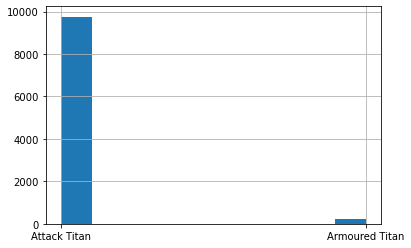

In [28]:
raw_results['winner'].hist()

<AxesSubplot:>

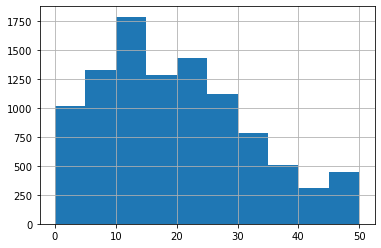

In [30]:
raw_results['total_damage_2'].hist()

In [56]:
# Aggregate stats

duel_mean_damage_1 = raw_results['total_damage_1'].mean()
duel_mean_damage_2 = raw_results['total_damage_2'].mean()

win_ratio_1 = (len(raw_results.loc[raw_results['winner'] == 'Attack Titan']) * 100)/len(raw_results)
win_ratio_2 = (len(raw_results.loc[raw_results['winner'] == 'Armoured Titan']) * 100)/len(raw_results)

turns_sum = raw_results['turns'].sum()

total_attacks_1 = titan_1.attacks*turns_sum
total_hits_1 = total_attacks_1 - raw_results['missed_1'].sum()
hit_ratio_1 = (total_hits_1*100)/total_attacks_1

total_attacks_2 = titan_2.attacks*turns_sum
total_hits_2 = total_attacks_2 - raw_results['missed_2'].sum()
hit_ratio_2 = (total_hits_2*100)/total_attacks_2

mean_turns_to_win_1 = (raw_results.loc[raw_results['winner'] == 'Attack Titan'])['turns'].mean()
mean_turns_to_win_2 = (raw_results.loc[raw_results['winner'] == 'Armoured Titan'])['turns'].mean()

d = {
    
    'win_ratio':[win_ratio_1, win_ratio_2],
    'duel_mean_damage':[duel_mean_damage_1, duel_mean_damage_2],
    'hit_ratio':[hit_ratio_1, hit_ratio_2],
    'mean_turns_to_win':[mean_turns_to_win_1, mean_turns_to_win_2]
}

stats = pd.DataFrame(data=d, index=['attack_titan', 'armoured_titan'])


In [57]:
stats

,win_ratio,duel_mean_damage,hit_ratio,mean_turns_to_win
attack_titan,97.6,59.6963,40.191007,5.02418
armoured_titan,2.4,19.2775,50.943843,6.70000


In [59]:
raw_results.to_pickle("data/raw/attack_armoured_10000_v1.pkl")
stats.to_pickle("data/stats/attack_armoured_stats_v1.pkl")